<a href="https://colab.research.google.com/github/rshamsini/COVID-19detection/blob/main/Object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Object Detection using yolov5 

In [ ]:
%cd /content/drive/MyDrive/Optum/yolov5

/content/drive/MyDrive/Optum/yolov5


In [ ]:
%pip install -qr requirements.txt  # install dependencies

     |████████████████████████████████| 636 kB 7.2 MB/s 


In [ ]:
#dependencies

import torch
from IPython.display import Image, clear_output  # to display images
import PIL

In [ ]:
#yolov5 setup using pytorch

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.9.0+cu102 (Tesla T4)


In [ ]:
#displaying image width and height

image = PIL.Image.open("/content/drive/MyDrive/Optum/images/val/b004b1fe809f.png")


width, height = image.size


print(width, height)

4240 3480


In [ ]:
#install latest version of albumentations

!pip install -U albumentations

     |████████████████████████████████| 631 kB 7.4 MB/s 
  Created wheel for imgaug: filename=imgaug-0.2.6-py3-none-any.whl size=654019 sha256=45662ad8aeb9d99a132574a71f668a79c48217d136e3d7462297e823f6fb5e5f
  Stored in directory: /root/.cache/pip/wheels/89/72/98/3ebfdba1069a9a8eaaa7ae7265cfd67d63ef0197aaee2e5f9c
Successfully built imgaug
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9


In [ ]:
# Install W&B 
!pip install -q --upgrade wandb
# Login 
import wandb
wandb.login()

     |████████████████████████████████| 1.8 MB 8.9 MB/s 
     |████████████████████████████████| 170 kB 71.2 MB/s 
     |████████████████████████████████| 138 kB 65.8 MB/s 
     |████████████████████████████████| 97 kB 6.9 MB/s 
     |████████████████████████████████| 133 kB 66.7 MB/s 
     |████████████████████████████████| 63 kB 2.4 MB/s 
     |████████████████████████████████| 62 kB 1.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


<IPython.core.display.Javascript object>

wandb: You can find your API key in your browser here: https://wandb.ai/authorize


wandb: Paste an API key from your profile and hit enter: ··········


False

# Training


In [ ]:
#image size --> 640 batch --> 16 epochs -->20 

!python train.py --img 640 --batch 16 --epochs 20 --data custom.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=custom.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=20, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache_images=True, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: Command 'git fetch && git config --get remote.origin.url' timed out after 5 seconds, for updates see https://github.com/ultralytics/yolov5
remote: Enumerating objects: 411, done.
remote: Counting objects: 100% (330/330), done.
remote: Compressing objects: 100% (84/84), done.
remote: Total 411 (delta 254), reused 294 (delta 246), pack-reused 81
Receiving objects: 100% (411/411), 145.42 KiB | 141.00 KiB/s, done.
Resolving deltas: 100% (274/274), com

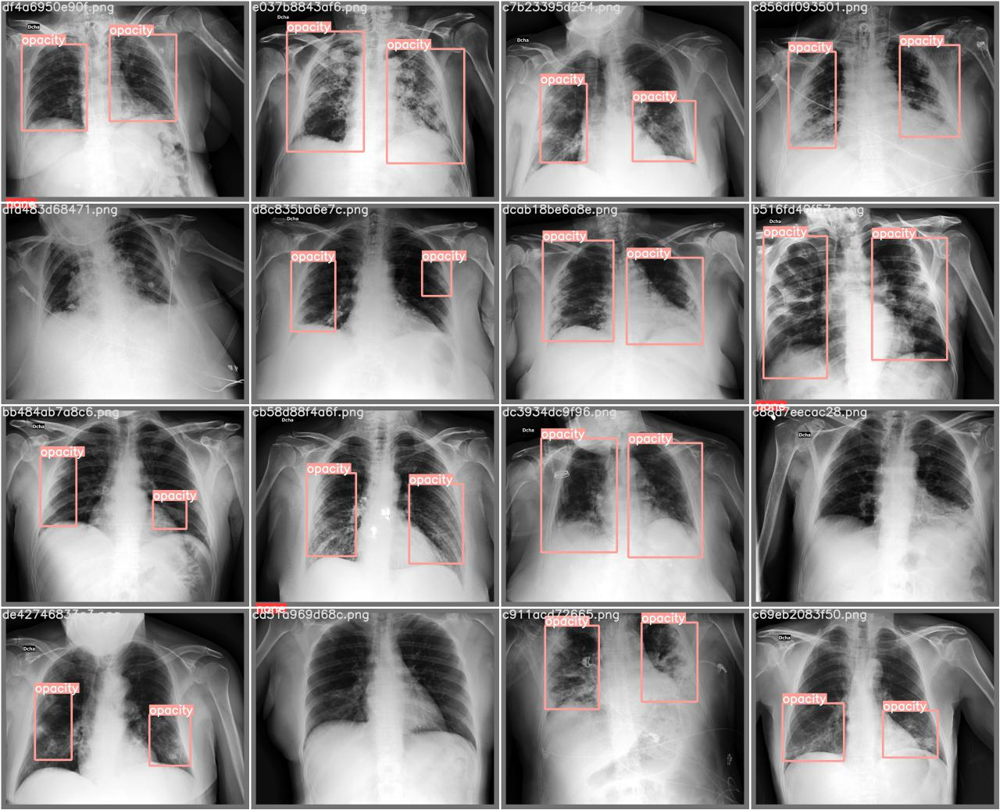

In [ ]:
#visualise the validation batch1 labels

Image(filename="/content/drive/MyDrive/Optum/yolov5/runs/train/exp8/val_batch1_labels.jpg",width=800)

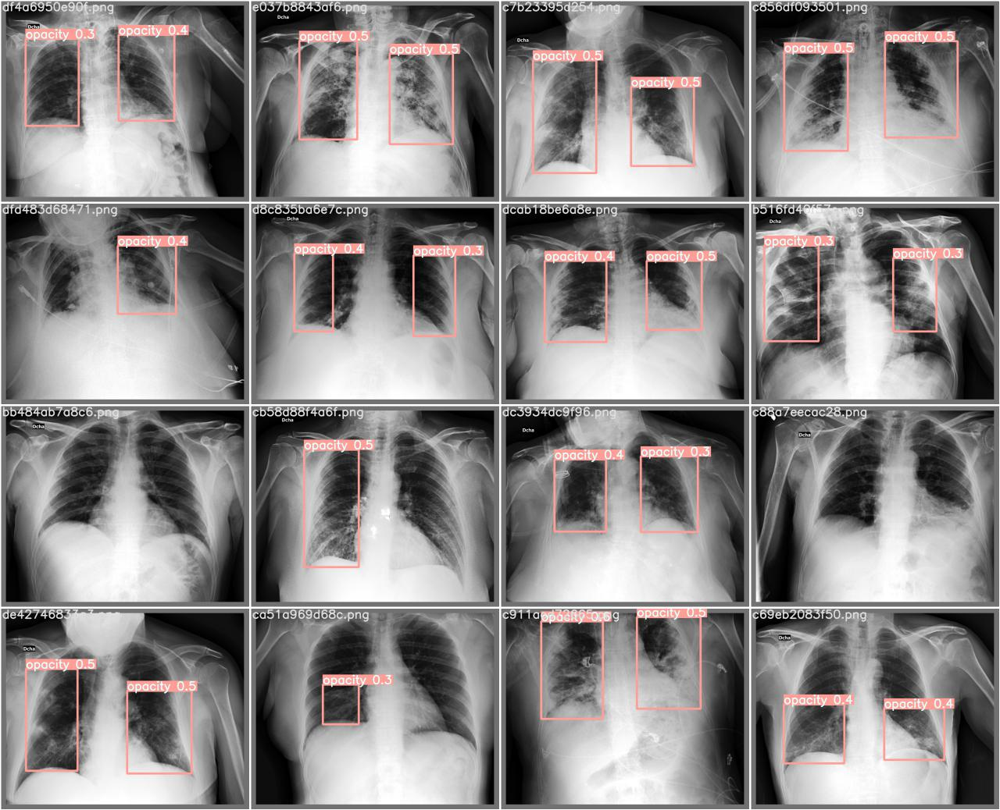

In [ ]:
#visualise the validation prediction batch1 

Image(filename="/content/drive/MyDrive/Optum/yolov5/runs/train/exp8/val_batch1_pred.jpg",width=800)

# Testing


In [ ]:
#test the model with few images(633)

!python detect.py --weights runs/train/exp8/weights/best.pt --source /content/drive/MyDrive/Optum/images/test  --img 640 --conf 0.281 --save-txt 

detect: weights=['runs/train/exp8/weights/best.pt'], source=/content/drive/MyDrive/Optum/images/test, imgsz=640, conf_thres=0.281, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False
YOLOv5 🚀 v5.0-319-g63a1971 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 224 layers, 7056607 parameters, 0 gradients, 1

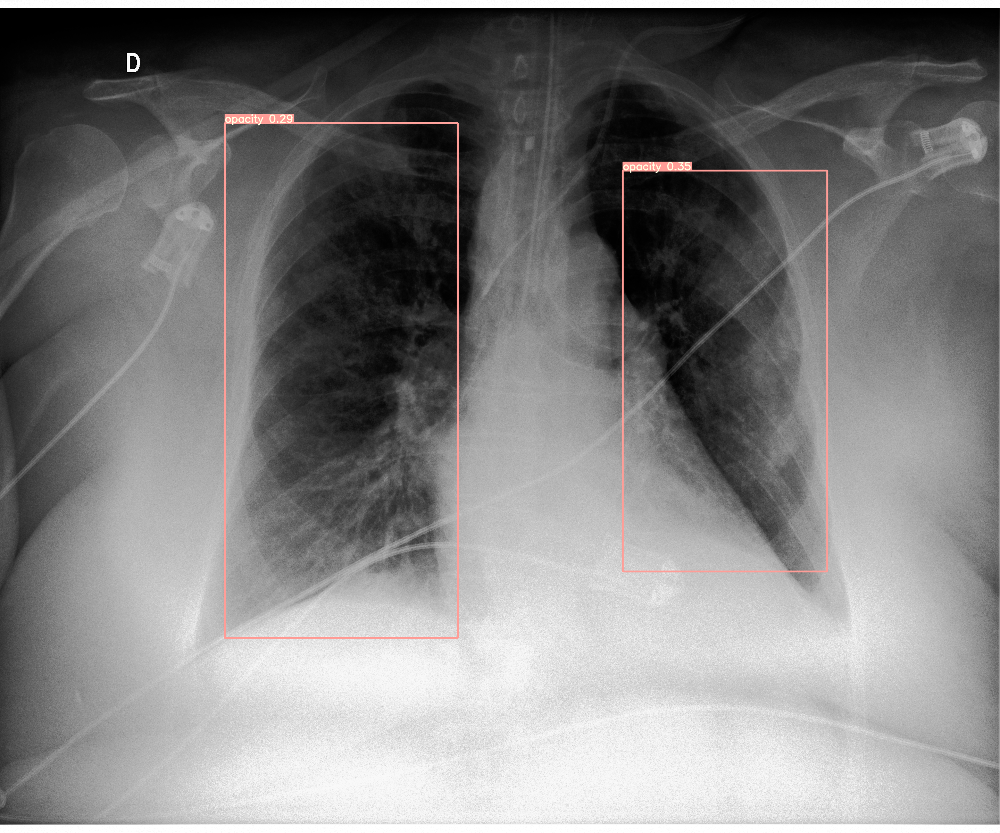

In [ ]:
#tested image

Image(filename="/content/drive/MyDrive/Optum/yolov5/runs/detect/exp5/e0309637bb7d.png",width=200)

In [ ]:
#tested image label

f = open("/content/drive/MyDrive/Optum/yolov5/runs/detect/exp5/labels/e0309637bb7d.txt", "r")
print(f.read())

1 0.341146 0.456667 0.232986 0.618333
1 0.724826 0.445208 0.204514 0.48125

